In [287]:
import numpy as np
import torch
import glob
import re

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

from functools import partial
from collections import OrderedDict

In [174]:
from traffic4cast.data.data_layout import volume_channel_indices
from traffic4cast.data.data_layout import channel_labels
from traffic4cast.data.data_layout import offset_map
from traffic4cast.data.dataset import T4CDataset

from traffic4cast.models.baseline_unet import UNetTransfomer

from traffic4cast.util.check_data_raw_dir import check_raw_data_dir
from traffic4cast.util.h5_util import load_h5_file

from traffic4cast.metrics.masking import get_static_mask, create_static_mask
from traffic4cast.metrics.mse import mse

In [207]:
BASE_FOLDER = "/Users/Vsevolod.Konyakhin/Desktop/data/traffic4cast"
MAPS_FOLDER = "/Users/Vsevolod.Konyakhin/Desktop/data/traffic4cast-maps"
COMPETITION = "temporal"
check_raw_data_dir(BASE_FOLDER, show_missing=True)
city = "MOSCOW"

File structure /Users/Vsevolod.Konyakhin/Desktop/data/traffic4cast:  (✓)


In [170]:
dataset = T4CDataset(
    BASE_FOLDER, f"{city}/training/2019*8ch.h5", 
    transform=partial(
        UNetTransfomer.unet_pre_transform,
        stack_channels_on_time=True,
        zeropad2d=None, batch_dim=False)
)

In [146]:
batch_size = 4
y_true_batched = list()

for index in range(batch_size):
    inp, y_true = dataset[index]
    
    print(inp.shape, y_true.shape)
    
    y_true_batched.append(y_true)
    
y_true_batched = torch.stack(y_true_batched)
y_true_batched.shape

torch.Size([96, 495, 436]) torch.Size([48, 495, 436])
torch.Size([96, 495, 436]) torch.Size([48, 495, 436])
torch.Size([96, 495, 436]) torch.Size([48, 495, 436])
torch.Size([96, 495, 436]) torch.Size([48, 495, 436])


torch.Size([4, 48, 495, 436])

In [148]:
y_hat_batched = torch.rand((batch_size, 48, 495, 436))
y_hat_batched.shape

torch.Size([4, 48, 495, 436])

In [149]:
from torch.nn.functional import mse_loss as torch_mse

torch_mse(y_true_batched, y_hat_batched)

tensor(6.0675)

In [150]:
torch_mse(
    y_true_batched.reshape(-1, 495, 436),
    y_hat_batched.reshape(-1, 495, 436)
)

tensor(6.0675)

In [211]:
city_static_map = get_static_mask("BARCELONA", BASE_FOLDER)
city_static_map.shape

(495, 436, 8)

In [248]:
generated_map_path = "/Users/Vsevolod.Konyakhin/Desktop/data/traffic4cast-maps/BARCELONA_static.h5"
gen_mask = load_h5_file(generated_map_path)
gen_mask.shape, type(gen_mask)

((495, 436, 8), numpy.ndarray)

In [247]:
generated_map_path = "/Users/Vsevolod.Konyakhin/Desktop/data/traffic4cast-maps/BARCELONA_combined_static.h5"
gen_mask = load_h5_file(generated_map_path)
gen_mask.shape, type(gen_mask)

((495, 436, 8), numpy.ndarray)

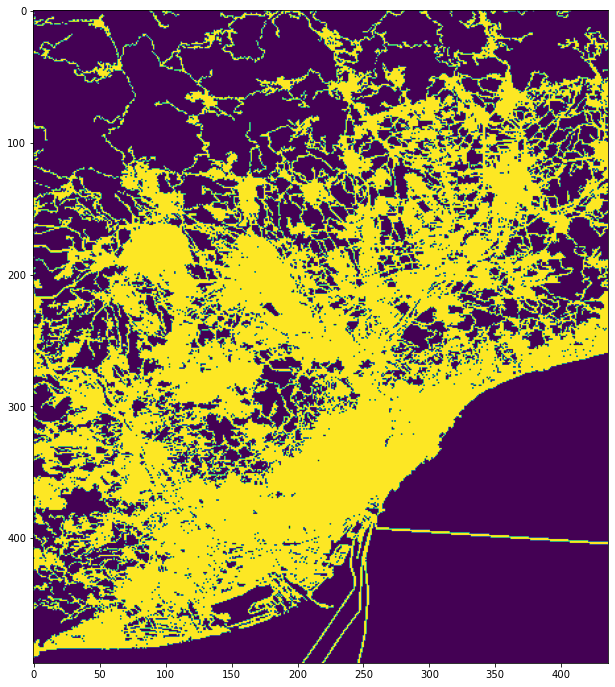

In [217]:
plt.imshow(city_static_map[:, :, 0])
plt.show()

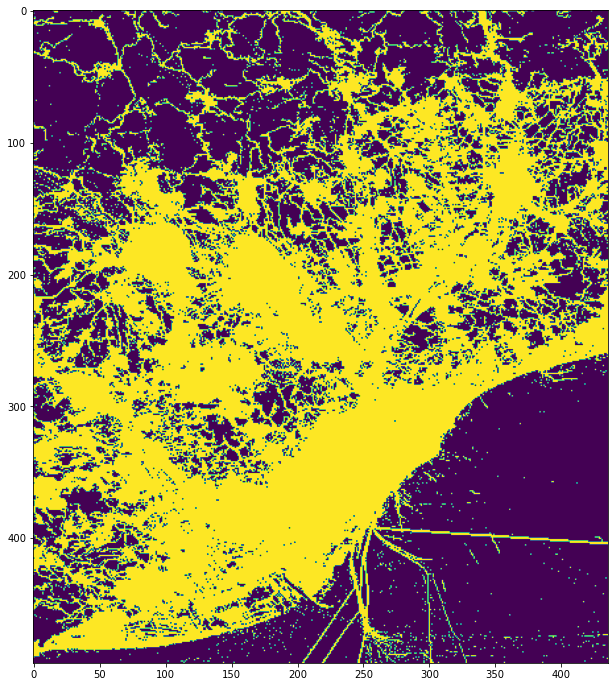

In [222]:
plt.imshow(gen_mask[:, :, 4])
plt.show()

In [233]:
for i in range(1):
    a = gen_mask[:, :, i]
    b = gen_mask[:, :, i + 1]    
    
    print(np.allclose(a, b))

False


In [234]:
np.unique(a, return_counts=True)

(array([0, 1], dtype=uint8), array([104216, 111604]))

In [235]:
np.unique(b, return_counts=True)

(array([0, 1], dtype=uint8), array([105413, 110407]))

In [236]:
np.unique(a & b, return_counts=True)

(array([0, 1], dtype=uint8), array([105413, 110407]))

In [242]:
np.unique(a - b, return_counts=True)

(array([0, 1], dtype=uint8), array([214623,   1197]))

In [245]:
np.unique(a, return_counts=True)

(array([0, 1], dtype=uint8), array([104216, 111604]))

In [246]:
np.unique(
    np.where(a + city_static_map[:, :, 0] > 0, 1, 0),
    return_counts=True
)

(array([0, 1]), array([104216, 111604]))

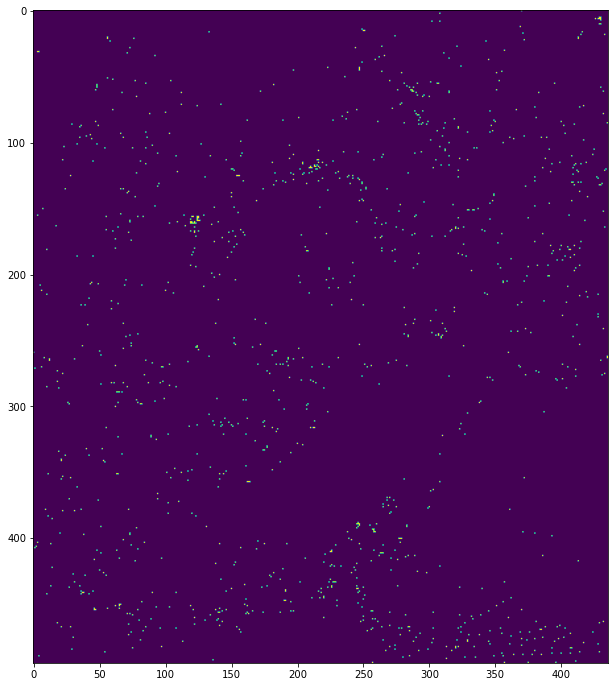

In [243]:
plt.imshow(a - b)
plt.show()

In [237]:
a - b

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [191]:
for i in range(7):
    a = gen_mask[:, :, i]
    b = gen_mask[:, :, i + 1]
    
    print(np.allclose(a, b))

False
False
False
False
False
False
False


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [196]:
np.count_nonzero(city_static_map[:, :, 0])

94666

In [203]:
for i in range(8):
    print(
        np.count_nonzero(gen_mask[:, :, i])
    )
    
    sum_mask = np.where(gen_mask[:, :, i] + city_static_map[:, :, i] > 0, 1, 0)
        
    print(
        np.count_nonzero(sum_mask)
    )

    print(np.unique(sum_mask))

19144
95087
[0 1]
16939
95018
[0 1]
17559
95026
[0 1]
16176
94984
[0 1]
17212
95030
[0 1]
15791
94971
[0 1]
18081
95005
[0 1]
16797
94972
[0 1]


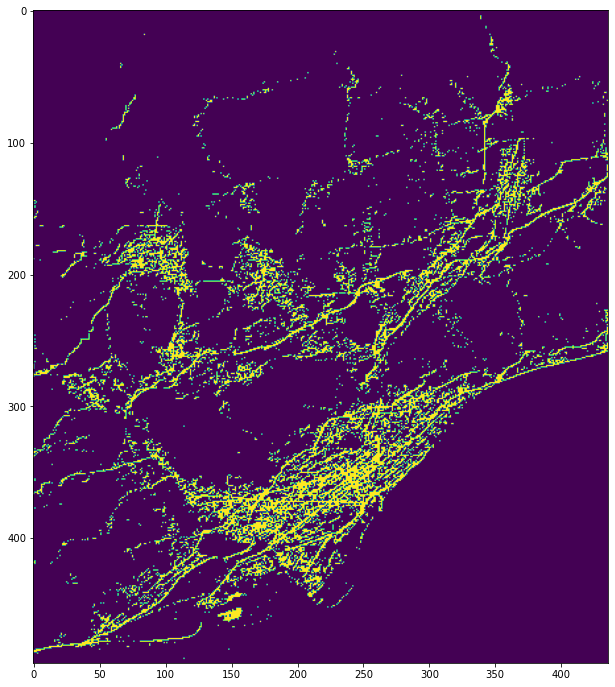

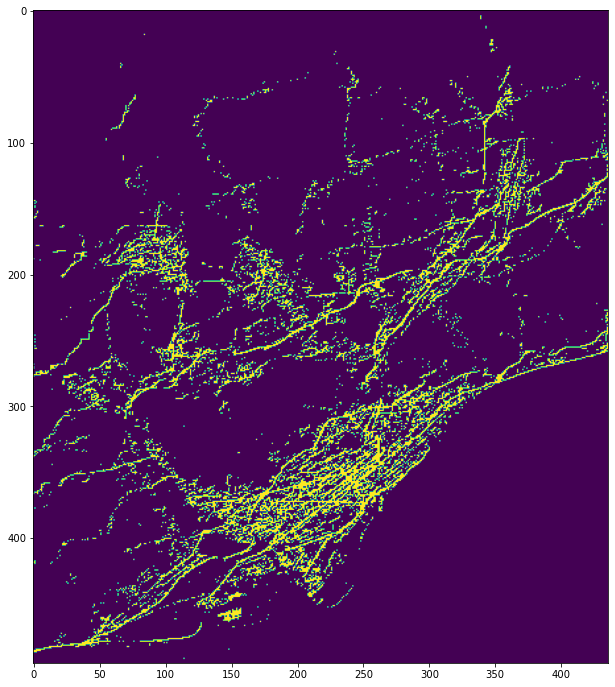

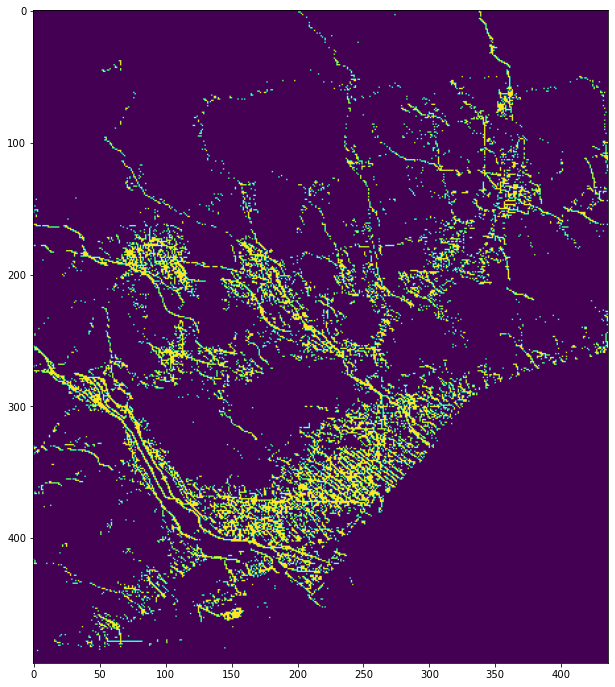

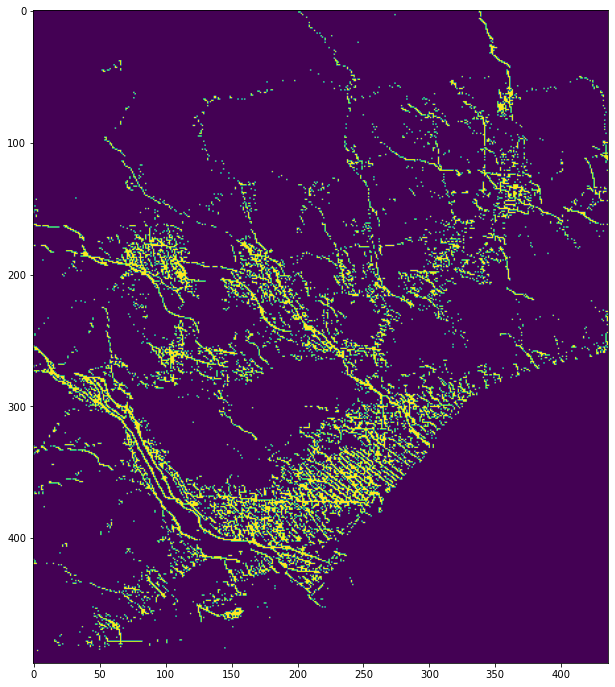

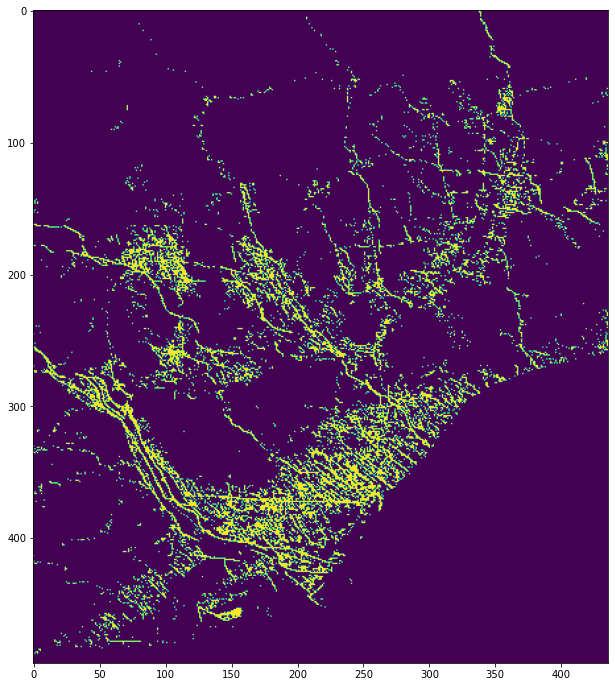

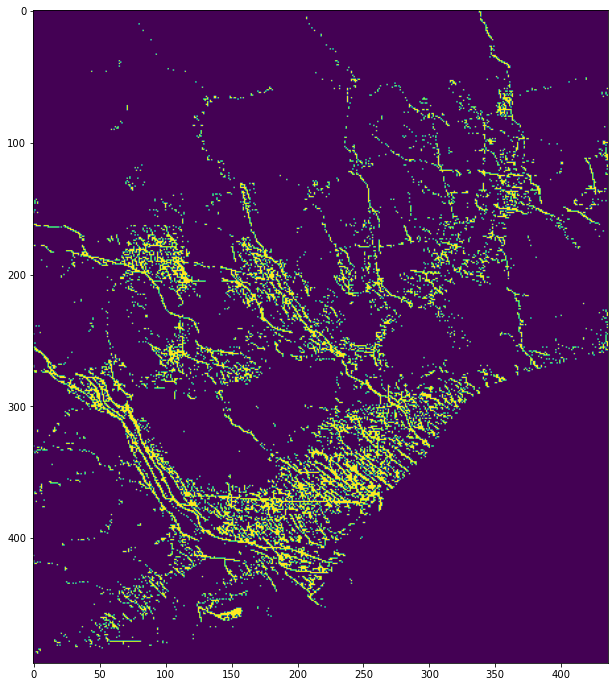

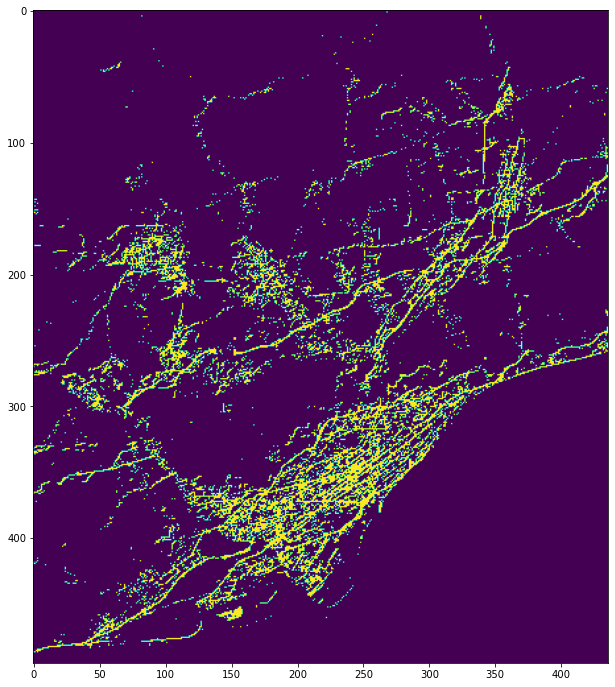

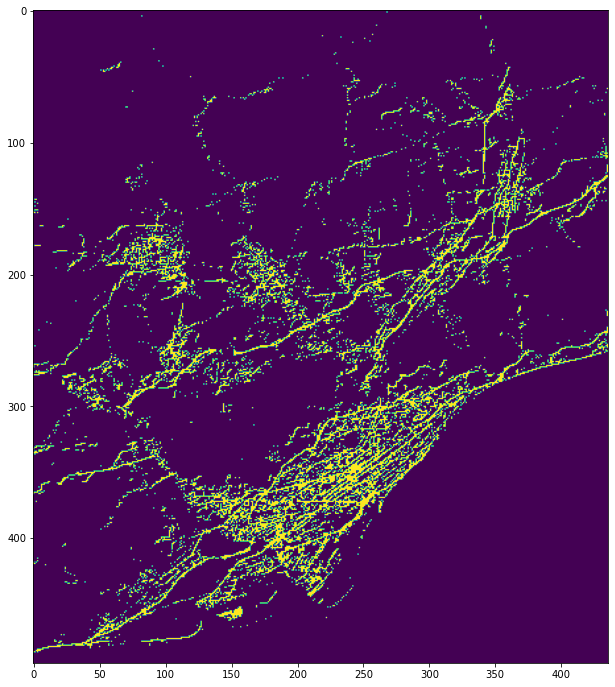

In [179]:
for i in range(8):
    
    plt.imshow(gen_mask[:, :, i])
    plt.show()

In [171]:
city_static_map = get_static_mask(city, BASE_FOLDER)
city_static_map.shape

(495, 436, 8)

In [152]:
city_static_map_torch = torch.from_numpy(city_static_map[:, :, 0])
city_static_map_torch.shape

torch.Size([495, 436])

In [153]:
zeropad2d = (0, 0, 0, 0) # TODO: move to config
if zeropad2d is not None:
    padding = torch.nn.ZeroPad2d(zeropad2d)
    city_static_map_torch_resized = padding(city_static_map_torch.unsqueeze(0).unsqueeze(0))[0][0]

In [154]:
city_static_map_torch_resized.shape

torch.Size([495, 436])

In [155]:
torch.count_nonzero(city_static_map_torch_resized)

tensor(94666)

In [160]:
y_true_batched

torch.Size([4, 48, 495, 436])

In [158]:
torch.count_nonzero(y_true_batched.reshape(-1, 495, 436) * city_static_map_torch_resized) 

tensor(25174)

In [157]:
y_true_batched.shape

torch.Size([4, 48, 495, 436])

In [172]:
for i in range(len(dataset)):
    y_hat = dataset[i][1]
    
    if torch.allclose(
        torch.count_nonzero(y_hat),
         torch.count_nonzero(y_hat * city_static_map_torch_resized)
    ):
        
        print(torch.count_nonzero(y_hat))
    
        print(torch.count_nonzero(y_hat * city_static_map_torch_resized))

KeyboardInterrupt: 

In [161]:
torch.count_nonzero(y_true_batched[0])

tensor(5936)

In [162]:
torch.count_nonzero(y_true_batched[0] * city_static_map_torch_resized) 

tensor(5823)

In [159]:
torch.count_nonzero(y_true_batched * city_static_map_torch_resized) 

tensor(25174)

In [123]:
for i in range(7):
    are_equal = np.allclose(
        city_static_map[:, :, i],
        city_static_map[:, :, i + 1],        
    )
    print(are_equal)

True
True
True
True
True
True
True


In [63]:
city_static_map = get_static_mask(city, BASE_FOLDER, num_slots=6)
city_static_map.shape

(6, 495, 436, 8)

In [68]:
a = torch.from_numpy(city_static_map.reshape(-1, 495, 436))
a.shape

torch.Size([48, 495, 436])

In [77]:
batch_size = 32

In [82]:
a.shape

torch.Size([48, 495, 436])

In [83]:
res = torch.stack([a] * 32)

In [85]:
res * a

tensor([[[[0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          ...,
          [1, 1, 1,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 1, 1, 1],
          [1, 1, 1,  ..., 1, 1, 1]],

         [[1, 1, 1,  ..., 1, 1, 1],
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          ...,
          [1, 1, 1,  ..., 1, 1, 1],
          [0, 0, 0,  ..., 1, 1, 1],
          [1, 1, 1,  ..., 1, 1, 1]],

         [[1, 1, 1,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 1, 1, 1],
          [0, 0, 0,  ..., 1, 1, 1],
          ...,
          [1, 1, 1,  ..., 1, 1, 1],
          [1, 1, 1,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 1, 1, 1]],

         ...,

         [[0, 0, 0,  ..., 1, 1, 1],
          [1, 1, 1,  ..., 1, 1, 1],
          [1, 1, 1,  ..., 0, 0, 0],
          ...,
          [0, 0, 0,  ..., 0, 0, 0],
          [1, 1, 1,  ..., 1, 1, 1],
          [1, 1, 1,  ..., 1, 1, 1]],

         [[1, 1, 1,  ..., 1, 1, 1],
          [1, 1, 

In [76]:
torch.unsqueeze(a, 0).expand(0, 1)

RuntimeError: expand(torch.LongTensor{[1, 48, 495, 436]}, size=[0, 1]): the number of sizes provided (2) must be greater or equal to the number of dimensions in the tensor (4)

In [53]:
torch.from_numpy(city_static_map).count_nonzero()

tensor(94666.)

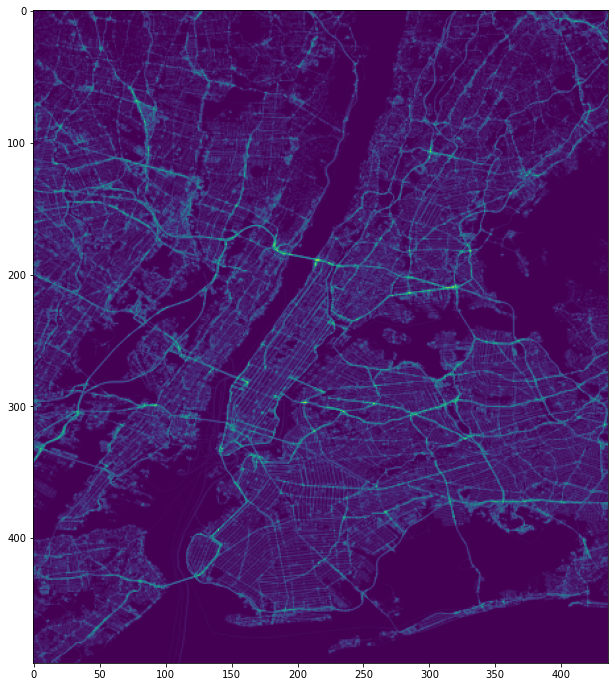

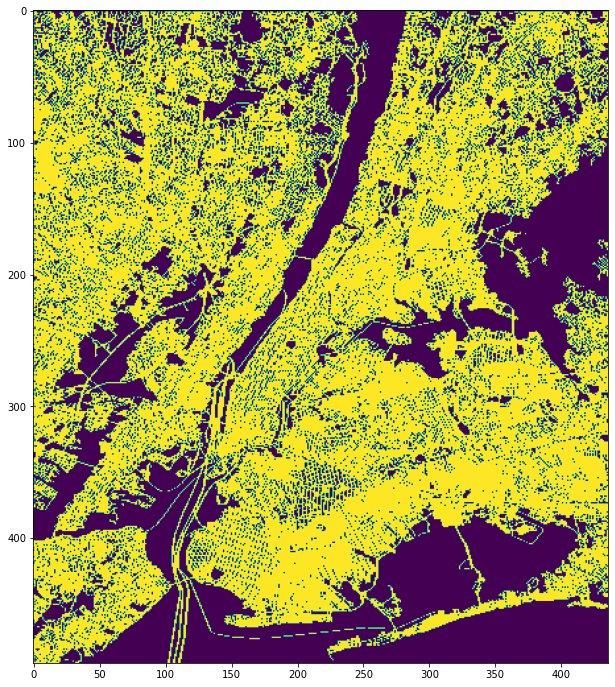

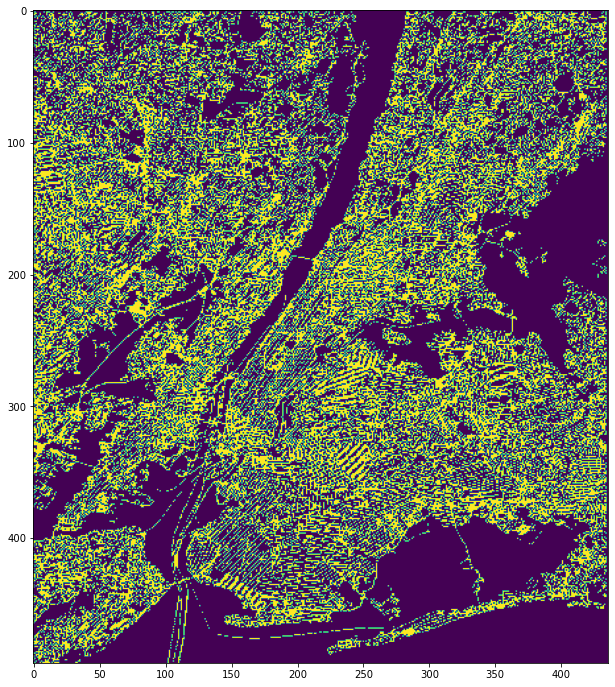

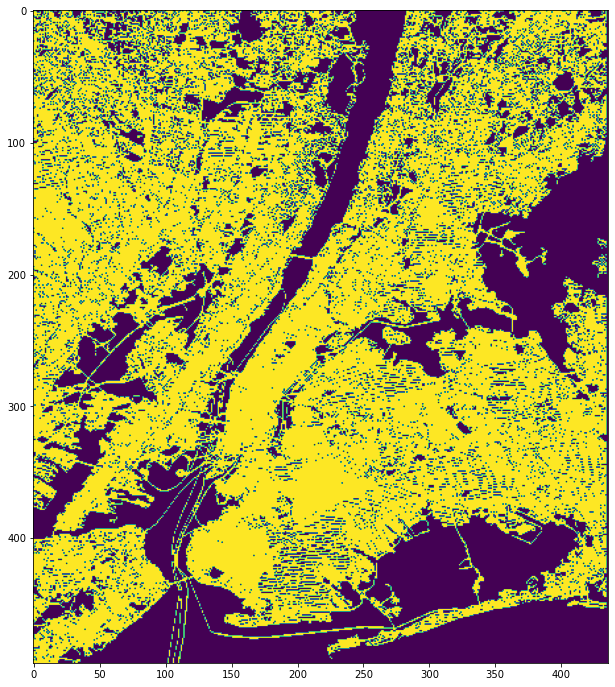

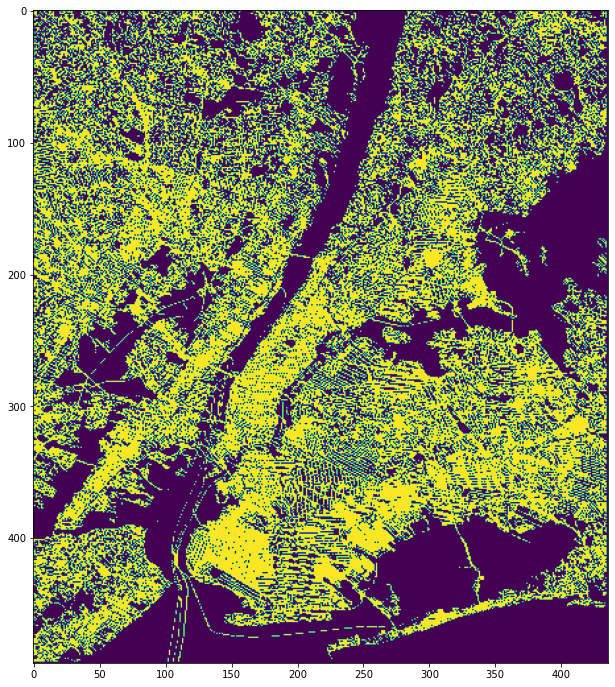

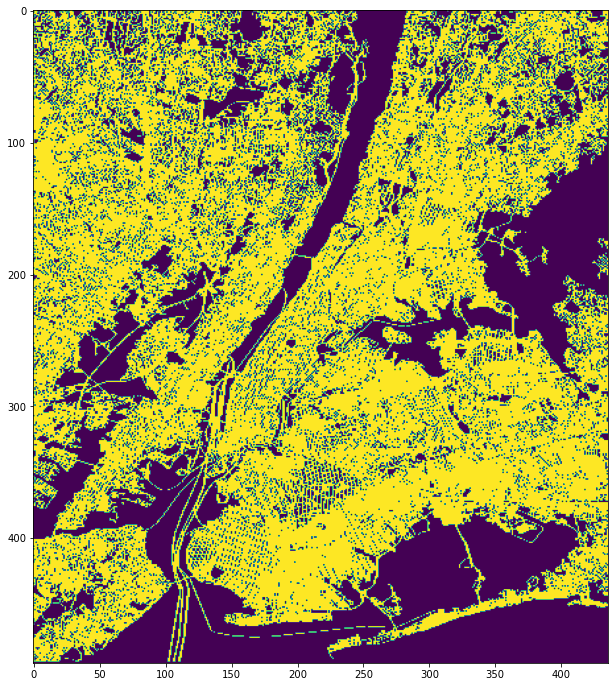

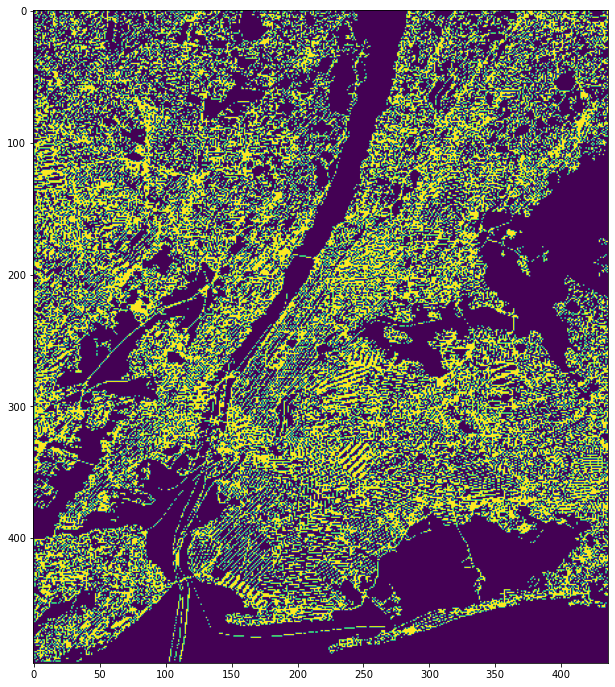

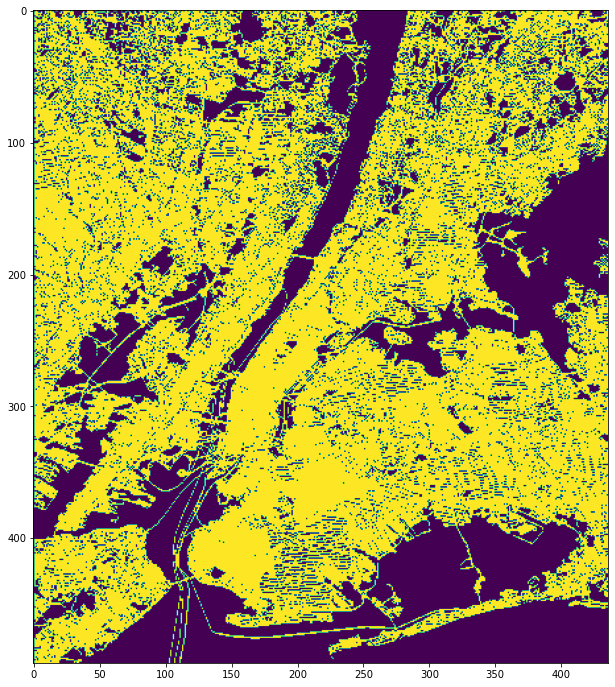

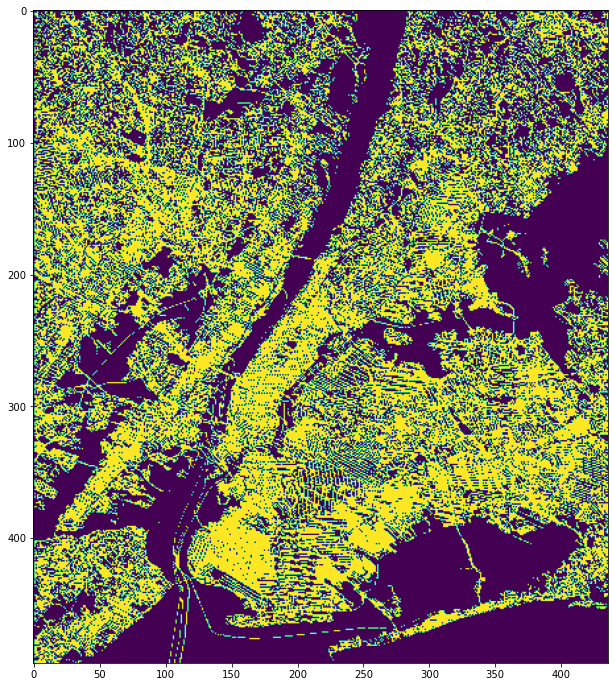

In [19]:
citymap = load_h5_file(f"{BASE_FOLDER}/{city}/{city}_static.h5")

for i in range(9):
    
    plt.imshow(citymap[i])
    plt.show()

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [3, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [ ]:
    static_mask_once = np.where(load_h5_file(f"{BASE_FOLDER}/{city}/{city}_static.h5")[0] > 0, 0, 1)

    axs[i, 1].set_title(f"{city} low-res map (495x436)")
    base_map = load_h5_file(f"{BASE_FOLDER}/{city}/{city}_static.h5")[0]

In [10]:
def create_static_mask(static_roads, num_slots=0):
    static_mask_once = np.where(static_roads[0] > 0, 1, 0)
    assert static_mask_once.shape == (495, 436)
    if num_slots > 0:
        static_mask = np.broadcast_to(static_mask_once, (num_slots, 495, 436))
        assert (static_mask[0] == static_mask_once).all()
        static_mask = np.repeat(static_mask, 8).reshape(num_slots, 495, 436, 8)
        assert static_mask.shape == (num_slots, 495, 436, 8), f"{static_mask.shape}"
        assert (static_mask[0, :, :, 0] == static_mask_once).all()
    else:
        static_mask = np.repeat(static_mask_once, 8).reshape(495, 436, 8)
        assert static_mask.shape == (495, 436, 8), f"{static_mask.shape}"
        assert (static_mask[:, :, 0] == static_mask_once).all()
        # Alternatively could also do expand_dims(axis=2) -> repeat(repeats=8, axis=2)
    return static_mask

In [11]:
def get_static_mask(city, base_folder, num_slots=0):  # noqa
    return create_static_mask(load_h5_file(f"{base_folder}/{city}/{city}_static.h5"), num_slots)

In [14]:
get_static_mask(city, BASE_FOLDER).shape

(495, 436, 8)